<div align="center">
  <img src="https://sharedeconomycpa.com/wp-content/uploads/2018/08/Airbnb-NYC-law.jpg" />
</div>

# 1. Introdução e Metadados

### 1.1. Contexto e Fontes de Dados

Os dados foram obtidos a partir da plataforma [Kaggle](https://www.kaggle.com/), em um dataset público compilado por Arian Azmoudeh.

- **Fonte Principal:** [New York City Airbnb Open Data](https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata).

- **Fonte Original:** Os dados são derivados da iniciativa [Inside Airbnb](https://insideairbnb.com/explore/), que disponibiliza dados públicos sobre as listagens da plataforma em várias cidades do mundo.

### Sobre o Airbnb

O Airbnb é uma plataforma que conecta pessoas que desejam alugar um espaço (como casas, apartamentos ou quartos) com viajantes em busca de acomodações temporárias. O serviço permite que anfitriões anunciem suas propriedades e que hóspedes reservem estadias, muitas vezes com preços mais acessíveis do que em hotéis tradicionais.

### 1.2. Sobre o Dataset e Estrutura

O dataset descreve a atividade de anúncios de acomodações na cidade de Nova York. As informações abrangem três áreas principais:

- **Anúncios (Listings):** Inclui descrições completas dos imóveis, localização geográfica (latitude e longitude), tipo de quarto, preço, regras da casa e informações sobre o anfitrião.
- **Avaliações (Reviews):** Contém dados sobre o número de avaliações, a data da última avaliação e a pontuação média das avaliações.
- **Disponibilidade (Calendar):** Informações sobre a disponibilidade do imóvel ao longo do ano (availability_365).

A escolha deste conjunto de dados se deve à sua riqueza de informações, que nos permite explorar diversas áreas do mercado de aluguel de curto prazo em Nova York.
Dentre as várias opções analisadas, este dataset se destacou por apresentar um cenário completo e realista para um projeto de Ciência de Dados: ele combina um grande volume de registros com desafios claros de tratamento e limpeza.

Uma análise preliminar já nos permitiu identificar diversos pontos de melhoria, que encaramos como oportunidades para demonstrar um fluxo de trabalho robusto. Ao invés de um dataset perfeitamente limpo, a necessidade de prepará-lo nos permite agregar mais valor e confiança à análise final. Objetivo é ir além da simples visualização de dados, buscando insights sobre como diferentes variáveis se relacionam e influenciam o ecossistema do Airbnb.

# 2. Análise Exploratória

Para a nossa análise, utilizaremos um conjunto de bibliotecas do ecossistema Python que se complementam.

* **Manipulação e Análise de Dados**
    A base do trabalho é a biblioteca [`pandas`](https://pandas.pydata.org/), que nos permite carregar e alterar dados usando `DataFrames` (tabelas) e `Series` (colunas). Para dados que contêm informações geográficas, como coordenadas, usaremos a [`geopandas`](https://geopandas.org/), que funciona como uma extensão do `pandas`.

* **Visualização de Dados e Mapas**
    Para desenhar gráficos, a biblioteca fundamental é a [`matplotlib`](https://matplotlib.org/). Sobre ela, podemos usar a [`seaborn`](https://seaborn.pydata.org/) para criar visualizações estatísticas mais ricas. Quando precisamos de interatividade, a [`plotly.express`](https://plotly.com/python/plotly-express/) é uma ótima opção. Para os mapas, a biblioteca [`folium`](https://python-visualization.github.io/folium/) nos permite visualizar dados geográficos de forma interativa.

* **Computação Numérica e Utilitários**
    Por trás de muitas operações de dados, a biblioteca [`numpy`](https://numpy.org/) é fundamental para cálculos numéricos eficientes com seus arrays. Além dela, teremos o auxílio de bibliotecas como `os` para interagir com arquivos, `joblib` para salvar nossos modelos, e `pycountry` e `reverse_geocoder` para nos ajudar a entender e padronizar dados de localização.

* **Machine Learning**
    Para a criação de modelos preditivos, a principal ferramenta será a [`scikit-learn`](https://scikit-learn.org/). Dela, importamos algoritmos como `LinearRegression` e `RandomForestRegressor`, que nos permitem treinar modelos capazes de realizar previsões.

## 2.1 Importação das bibliotecas

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.ticker import MaxNLocator
import numpy as np
import folium
from folium.plugins import FastMarkerCluster
from IPython.display import display
import pycountry
import plotly.express as pxa
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from branca.element import Template, MacroElement
from folium.plugins import HeatMap
import reverse_geocoder as rg
from sklearn.ensemble import RandomForestRegressor
import joblib
import os
from sklearn.linear_model import LinearRegression
import zipfile

In [2]:
df = pd.read_csv("./airbnb-dataset-silver.csv", sep=",", encoding='utf8', low_memory=False)

## 2.2 Head do Dataset

A tabela abaixo mostra de maneira breve o dataframe utilizado nesse projeto:


In [3]:
df.head(3)

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,instant_bookable,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,has_house_rules
0,1001254,Clean & quiet apt home by the park,80014485718,False,Madaline,Brooklyn,Kensington,40.64749,-73.97237,False,...,193.0,10,9,2021-10-19,0.21,4.0,6,286,Clean up and treat the home the way you'd like...,True
1,1002102,Skylit Midtown Castle,52335172823,True,Jenna,Manhattan,Midtown,40.75362,-73.98377,False,...,28.0,30,45,2022-05-21,0.38,4.0,2,228,Pet friendly but please confirm with me if the...,True
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,True,Elise,Manhattan,Harlem,40.80902,-73.94190,True,...,124.0,3,0,NaN,NaN,5.0,1,352,"I encourage you to use my kitchen, cooking and...",True


## 2.3 Dimensões do Dataset

A dimensão do dataset foi reduzida após o processo de limpeza. Essa diminuição é resultado da exclusão de linhas com dados ausentes e da remoção de colunas consideradas não significativas para a análise.

In [4]:
linhas, colunas = df.shape

print(f"Número de tuplas: {linhas}")
print(f"Número de colunas: {colunas}")

Número de tuplas: 99417
Número de colunas: 24


## 2.4 Identificação das Colunas e Tipos de Dados

No nosso ETL, as colunas foram normalizadas. A coluna 'name', por exemplo, antes era 'NAME', e a coluna 'neighbourhood_group' antes possuía um espaço, sendo 'neighbourhood group'.

Além disso, não existem mais colunas com o tipo object, pois os valores ausentes foram removidos e os valores incompatíveis também. Os tipos de dados foram corrigidos durante o processo de ETL.

In [5]:
df.columns

Index(['id', 'name', 'host_id', 'host_identity_verified', 'host_name',
       'neighbourhood_group', 'neighbourhood', 'lat', 'long',
       'instant_bookable', 'cancellation_policy', 'room_type',
       'construction_year', 'price', 'service_fee', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'review_rate_number', 'calculated_host_listings_count',
       'availability_365', 'house_rules', 'has_house_rules'],
      dtype='object')

In [6]:
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_identity_verified               bool
host_name                          object
neighbourhood_group                object
neighbourhood                      object
lat                               float64
long                              float64
instant_bookable                     bool
cancellation_policy                object
room_type                          object
construction_year                   int64
price                             float64
service_fee                       float64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
review_rate_number                float64
calculated_host_listings_count      int64
availability_365                    int64
house_rules                        object
has_house_rules                   

## 2.5 Qualidade dos Dados

### 2.5.1 Análise de Valores Ausentes (Nulos/NaN)

#### Dados não nulos

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99417 entries, 0 to 99416
Data columns (total 24 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              99417 non-null  int64  
 1   name                            99417 non-null  object 
 2   host_id                         99417 non-null  int64  
 3   host_identity_verified          99417 non-null  bool   
 4   host_name                       99417 non-null  object 
 5   neighbourhood_group             99417 non-null  object 
 6   neighbourhood                   99417 non-null  object 
 7   lat                             99417 non-null  float64
 8   long                            99417 non-null  float64
 9   instant_bookable                99417 non-null  bool   
 10  cancellation_policy             99364 non-null  object 
 11  room_type                       99417 non-null  object 
 12  construction_year               

#### Dados nulos

In [8]:
df.isnull().sum()

id                                    0
name                                  0
host_id                               0
host_identity_verified                0
host_name                             0
neighbourhood_group                   0
neighbourhood                         0
lat                                   0
long                                  0
instant_bookable                      0
cancellation_policy                  53
room_type                             0
construction_year                     0
price                                 0
service_fee                           0
minimum_nights                        0
number_of_reviews                     0
last_review                       15184
reviews_per_month                 15182
review_rate_number                    0
calculated_host_listings_count        0
availability_365                      0
house_rules                           0
has_house_rules                       0
dtype: int64

#### Tuplas com pelo menos um valor ausente (Nulos/NaN)

In [9]:
number_of_rows_with_null_nan_values = len(df.isnull().any(axis=1))
print(f"Número de registros com pelo menos um valor nulo ou nan: {number_of_rows_with_null_nan_values}")

Número de registros com pelo menos um valor nulo ou nan: 99417


#### Porcentagem de nulos por coluna

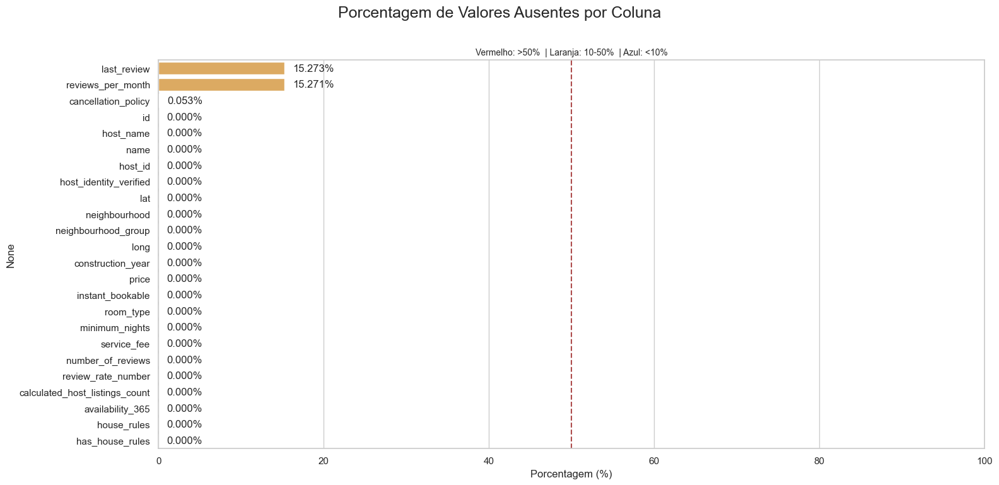

In [10]:
null_perc = (df.isnull().sum() / len(df) * 100).sort_values(ascending=False)

colors = ['#d9534f' if v > 50 else '#f0ad4e' if v > 10 else '#5bc0de' for v in null_perc.values]

sns.set_theme(style="whitegrid")
plt.figure(figsize=(16, 8))
ax = sns.barplot(x=null_perc.values, y=null_perc.index, hue=null_perc.index, palette=colors, legend=False)

plt.suptitle("Porcentagem de Valores Ausentes por Coluna", fontsize=18, y=0.96)
ax.set_title("Vermelho: >50%  | Laranja: 10-50%  | Azul: <10%", fontsize=10)
ax.set_xlabel("Porcentagem (%)")
ax.set_xlim(0, 100)

for p in ax.patches:
    w = p.get_width()
    ax.text(w + 1, p.get_y() + p.get_height()/2, f'{w:.3f}%', va='center')

ax.axvline(50, color='darkred', linestyle='--', alpha=0.7)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

#### Distribuição de dados ausentes

<Axes: >

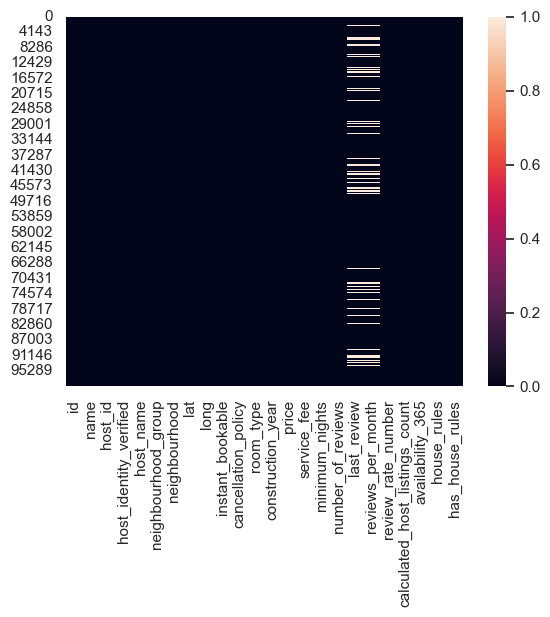

In [11]:
sns.heatmap(df.isnull())

### 2.5.2 Identificação de Registros Duplicados

Esta seção apresenta a análise da presença de dados duplicados no dataset.

É notável que, após a etapa de remoção no processo de ETL, o conjunto de dados está completamente livre de duplicatas. A validação dessa limpeza é confirmada por múltiplos indicadores:

* O **total** de registros duplicados é igual a **0**.
* A **amostra** de tuplas duplicadas está vazia.
* A **proporção** de duplicatas é de **0%**, indicando que 100% dos registros são únicos.
* O **gráfico de distribuição** confirma visualmente a ausência de entradas duplicadas.

#### Total de tuplas com id's duplicados

In [12]:
total = len(df)
dups = df.duplicated().sum()

print(f"Total de linhas: {total}")
print(f"Total de duplicadas: {dups}")

Total de linhas: 99417
Total de duplicadas: 0


#### Amostra das tuplas duplicadas

In [13]:
resumo = (
    df.groupby([c for c in df.columns if c != "id"], dropna=False)
      .agg(ids=("id", list),
           ocorrencias=("id", "size"),
           posicoes=("id", lambda s: list(s.index)))
      .reset_index()
      .query("ocorrencias > 1")
      .sort_values("ocorrencias", ascending=False)
)

resumo = resumo[["ids","name","ocorrencias","posicoes"] + 
                [c for c in resumo.columns if c not in ["ids","name","ocorrencias","posicoes"]]]
resumo

,ids,name,ocorrencias,posicoes,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,has_house_rules


#### Proporção entre duplicados e únicos:

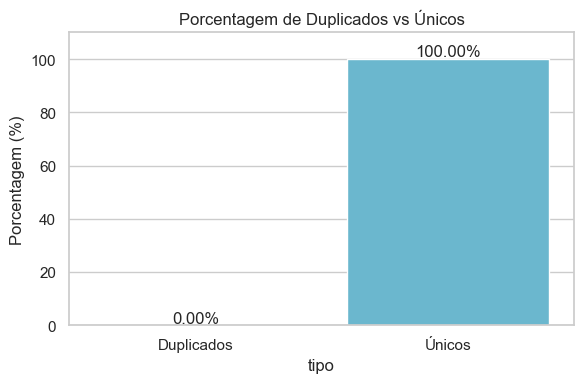

In [14]:
total = len(df)
dups = df.duplicated().sum()
stats = pd.DataFrame({
    "tipo": ["Duplicados", "Únicos"],
    "porcentagem": pd.Series([dups, total - dups]) / total * 100
})

sns.set_theme(style="whitegrid")
plt.figure(figsize=(6,4))
ax = sns.barplot(
    data=stats,
    x="tipo", y="porcentagem",
    hue="tipo", palette=["#d9534f", "#5bc0de"],
    legend=False
)

for p in ax.patches:
    h = p.get_height()
    ax.text(p.get_x()+p.get_width()/2, h+1, f"{h:.2f}%", ha="center")

ax.set_title("Porcentagem de Duplicados vs Únicos")
ax.set_ylabel("Porcentagem (%)")
plt.ylim(0, 110)
plt.tight_layout()
plt.show()

#### Distribuição das duplicadas:

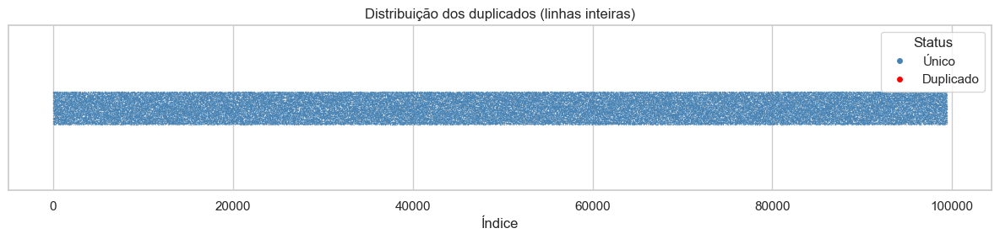

In [15]:
alpha_unico, size_unico = 0.5, 1
alpha_dup, size_dup = 1, 1

plot_df = pd.DataFrame({
    "Índice": df.index,
    "Duplicado": df.duplicated(keep=False).map({True: "Duplicado", False: "Único"})
})

fig, ax = plt.subplots(figsize=(12, 3))
sns.stripplot(data=plot_df[plot_df.Duplicado=="Único"],x="Índice",y=[""]*plot_df.Duplicado.eq("Único").sum(),
              color="steelblue",alpha=alpha_unico,size=size_unico,ax=ax)
sns.stripplot(data=plot_df[plot_df.Duplicado=="Duplicado"],x="Índice",y=[""]*plot_df.Duplicado.eq("Duplicado").sum(),
              color="red",alpha=alpha_dup,size=size_dup,ax=ax)

legend_elements=[Line2D([0],[0],marker='o',color='w',label='Único',markerfacecolor='steelblue',markersize=6),
                 Line2D([0],[0],marker='o',color='w',label='Duplicado',markerfacecolor='red',markersize=6)]
ax.legend(handles=legend_elements,title="Status",loc="upper right")

plt.title("Distribuição dos duplicados (linhas inteiras)")
plt.xlabel("Índice");plt.ylabel("")
plt.tight_layout();plt.show()

### 2.5.3 Resumo Estatístico Descritivo das Colunas

In [16]:
df.drop(columns=["id", "host_id"]).describe()

,lat,long,construction_year,price,service_fee,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
count,99417.000000,99417.000000,99417.000000,99417.000000,99417.000000,99417.000000,99417.000000,84235.000000,99417.000000,99417.000000,99417.000000
mean,40.728029,-73.949592,2012.487633,625.528733,125.106561,7.838257,27.292958,1.377313,3.281149,7.970920,140.480652
std,0.055872,0.049599,5.761996,331.661249,66.335630,16.976038,49.084275,1.748064,1.283670,32.399731,133.384732
min,40.499790,-74.249840,2003.000000,50.000000,10.000000,1.000000,0.000000,0.010000,1.000000,1.000000,0.000000
25%,40.688690,-73.982560,2008.000000,340.000000,68.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,40.722220,-73.954430,2012.000000,625.000000,125.000000,3.000000,7.000000,0.740000,3.000000,1.000000,97.000000
75%,40.762760,-73.932260,2017.000000,913.000000,183.000000,5.000000,30.000000,2.010000,4.000000,2.000000,269.000000
max,40.916970,-73.705220,2022.000000,1200.000000,240.000000,365.000000,1024.000000,90.000000,5.000000,332.000000,365.000000


**1. Localização e Idade dos Imóveis:**

* As coordenadas de latitude (`lat`) e longitude (`long`) estão concentradas em uma área geográfica específica (média de 40.72, -73.94), mostrando que os dados são de **Nova York**.
* Os imóveis são relativamente modernos, com o ano de construção (`construction_year`) variando de **2003 a 2022**, sendo a média e a mediana em 2012.

**2. Preços e Taxas:**

* O preço da diária (`price`) varia significativamente, indo de 50 a 1200, com uma média de 625.
* A taxa de serviço (`service_fee`) acompanha o preço, com uma média de 125.

**3. Padrões de Reserva e Disponibilidade:**

* A maioria das acomodações exige um mínimo de **3 noites** (`minimum_nights`), como visto na mediana.
* A disponibilidade anual (`availability_365`) tem uma média de 141 dias.

**4. Avaliações e Popularidade:**

* A nota de avaliação (`review_rate_number`) vai de **1 a 5**, com uma média de 3.28.
* A maioria dos imóveis tem poucas avaliações (mediana de 7), mas alguns são extremamente populares, com o máximo chegando a **1.024 avaliações** (`number_of_reviews`).

**5. Perfil dos Anfitriões:**

* A maioria dos anfitriões (`calculated_host_listings_count`) possui apenas **1 imóvel** (mediana). A média de quase 8 imóveis é influenciada por uma minoria de anfitriões com um grande número de propriedades (até 332).

### 2.5.4 Problemas de Formato

Confirmando se o tratamento da coluna de preço foi bem-sucedido: remoção do '$' e conversão para o tipo float64

In [17]:
primeiros_valores = df[['price', 'service_fee']].head()

print(primeiros_valores)

print("\nTipos de dados das colunas:")
print(df[['price', 'service_fee']].dtypes)

   price  service_fee
0  966.0        193.0
1  142.0         28.0
2  620.0        124.0
3  368.0         74.0
4  204.0         41.0

Tipos de dados das colunas:
price          float64
service_fee    float64
dtype: object


### 2.5.5 Valores Inconsistentes (Outliers negativos)

Análise da presença de valores negativos em colunas onde esses valores não são esperados, com exceção de Latitude e Longitude, que podem naturalmente conter números negativos.

In [18]:
df_numeric = df.select_dtypes(include=np.number)
contagem_negativos = (df_numeric < 0).sum()
colunas_e_contagem = contagem_negativos[contagem_negativos > 0]

if 'long' in colunas_e_contagem.index:
    colunas_e_contagem = colunas_e_contagem.drop('long')

print("Contagem de valores negativos por coluna:")
print(colunas_e_contagem)

Contagem de valores negativos por coluna:
Series([], dtype: int64)


### 2.5.6 Valores Inconsistentes na coluna 'availability_365'

Verificando a existência de valores maiores que 365, o que é impossível, já que a coluna representa quantos dias estão disponíveis dentro de um período de um ano.

In [19]:
outliers_disponibilidade = df[df['availability_365'] > 365]

print(f"Encontrados {len(outliers_disponibilidade)} registros com disponibilidade > 365 dias.")
print(outliers_disponibilidade.head())

Encontrados 0 registros com disponibilidade > 365 dias.
Empty DataFrame
Columns: [id, name, host_id, host_identity_verified, host_name, neighbourhood_group, neighbourhood, lat, long, instant_bookable, cancellation_policy, room_type, construction_year, price, service_fee, minimum_nights, number_of_reviews, last_review, reviews_per_month, review_rate_number, calculated_host_listings_count, availability_365, house_rules, has_house_rules]
Index: []

[0 rows x 24 columns]


### 2.5.7 Valores Inconsistentes na coluna 'minimum_nights'

Verificando a existência de valores extremamente altos em minimum_nights (ex: maiores que 1000 dias). Embora não seja estritamente impossível, um valor tão elevado é improvável e sugere um erro de inserção ou que o imóvel não está de fato disponível.

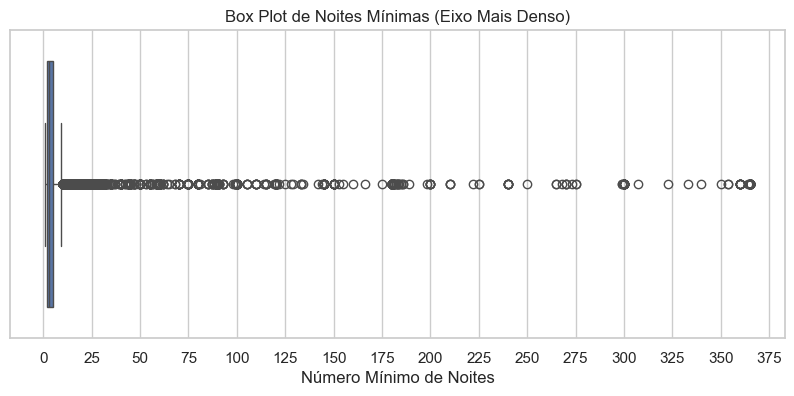

In [20]:
plt.figure(figsize=(10, 4))
sns.boxplot(x=df['minimum_nights'])
plt.title('Box Plot de Noites Mínimas (Eixo Mais Denso)')
plt.xlabel('Número Mínimo de Noites')

plt.gca().xaxis.set_major_locator(MaxNLocator(nbins=20)) 

plt.show()

## 4. Exploração dos dados:

### 4.1 Matriz de confusão

Para entender quais variáveis numéricas têm a maior influência sobre o preço, analisamos a matriz de correlação. Um valor próximo de +1 ou -1 indica uma forte correlação linear (positiva ou negativa, respectivamente) com a nossa variável alvo.

Correlação das colunas numéricas com o preço:
price                             1.000000
service_fee                       0.999991
number_of_reviews                 0.005219
reviews_per_month                 0.004150
long                              0.003573
host_id                           0.003531
instant_bookable                  0.000623
calculated_host_listings_count   -0.001206
construction_year                -0.004073
availability_365                 -0.004150
host_identity_verified           -0.004304
lat                              -0.004323
review_rate_number               -0.005494
has_house_rules                  -0.005840
minimum_nights                   -0.006170
Name: price, dtype: float64


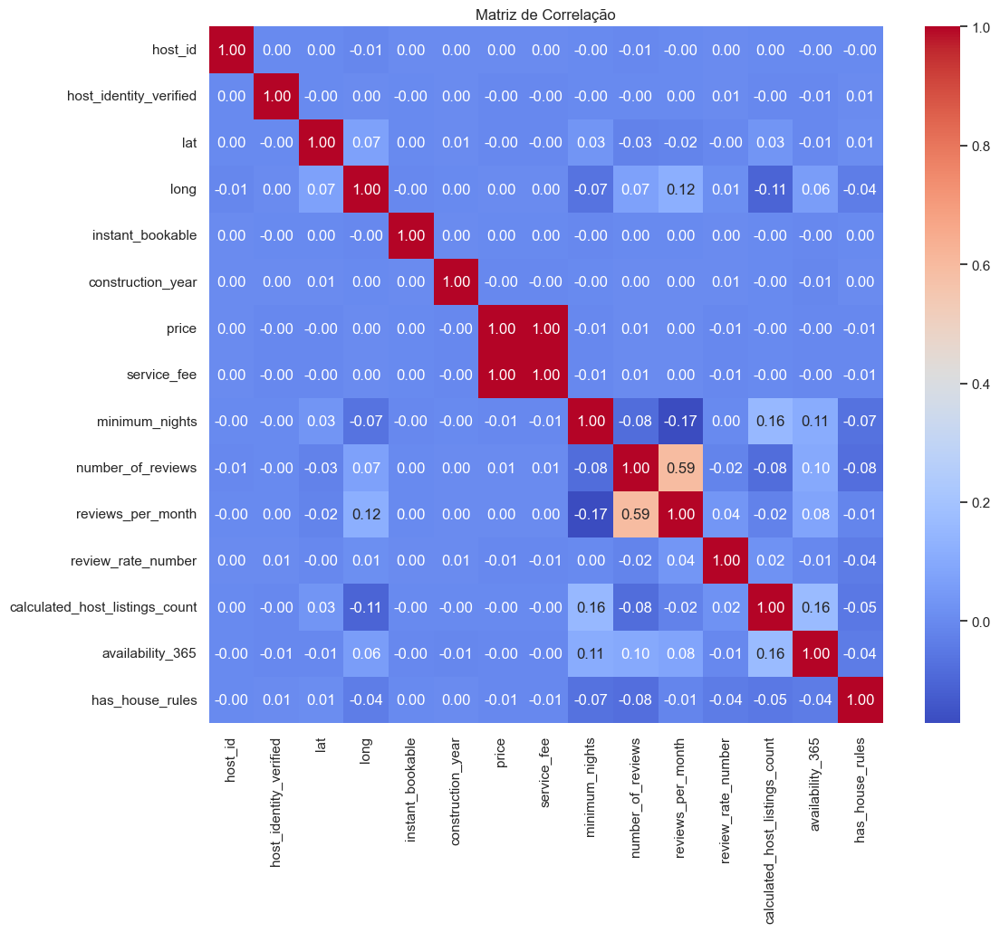

In [21]:
correlation_matrix = df.drop(columns='id', errors='ignore').corr(numeric_only=True)
print("Correlação das colunas numéricas com o preço:")
print(correlation_matrix['price'].sort_values(ascending=False))

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Matriz de Correlação")
plt.show()

A partir da matriz e da lista de correlações, podemos extrair as seguintes observações sobre a variável `price`:

#### Correlação Quase Perfeita (Multicolinearidade)
* `service_fee`: Apresenta uma correlação de **+0.999991** com `price`. Um valor tão próximo de 1 indica uma relação linear quase perfeita. Isso sugere fortemente que a `service_fee` é uma variável derivada diretamente do `price` (por exemplo, uma porcentagem fixa do preço da diária). Em um cenário de modelagem preditiva, essa variável causaria **vazamento de dados (data leakage)**, pois ela não estaria disponível antes da definição do preço. Portanto, `service_fee` deve ser removida antes do treinamento de um modelo.

#### Correlações Extremamente Fracas
* Ao contrário da observação inicial, as demais variáveis apresentam uma correlação linear muito fraca, praticamente nula, com o `price`. Variáveis como `number_of_reviews` (+0.0052) e `reviews_per_month` (+0.0041) são as que possuem a maior correlação *positiva* (depois de `service_fee`), mas seus valores são tão próximos de zero que indicam não haver uma relação linear significativa.
* Da mesma forma, as correlações negativas mais "fortes", como `minimum_nights` (-0.0061) e `has_house_rules` (-0.0058), também são insignificantes.


### 4.2 Ranking de Features com Modelo RandomForest

Para superar as limitações da matriz de correlação, que se restringe a relações lineares entre variáveis numéricas, adotamos uma abordagem mais completa e robusta utilizando um modelo RandomForestRegressor. Este método avançado nos permite avaliar o poder preditivo de todas as features em conjunto, capturando interações complexas e não lineares entre variáveis numéricas e categóricas, como room_type e neighbourhood. 

Cientes das limitações computacionais, nosso grupo realizou uma pré-seleção estratégica das colunas mais promissoras. Essa escolha foi deliberada, com o objetivo de focar o processamento nos atributos que, por hipótese e conhecimento de negócio, exercem a maior influência sobre a precificação de imóveis, como localização, reputação, características da acomodação e políticas de reserva.

Carregando modelo e colunas existentes de ./assets...

As 30 features mais importantes:
                              Feature  Importance
1                                long    0.260635
0                                 lat    0.253324
3                   number_of_reviews    0.153229
2                      minimum_nights    0.078083
4                  review_rate_number    0.067206
237            room_type_Private room    0.023236
239              has_house_rules_True    0.022766
233             instant_bookable_True    0.019376
5         host_identity_verified_True    0.019038
234      cancellation_policy_moderate    0.017135
235        cancellation_policy_strict    0.016171
238             room_type_Shared room    0.004674
22   neighbourhood_Bedford-Stuyvesant    0.002303
226        neighbourhood_Williamsburg    0.002178
37             neighbourhood_Bushwick    0.001539
139             neighbourhood_Midtown    0.001537
61        neighbourhood_Crown Heights    0.001525
6        nei

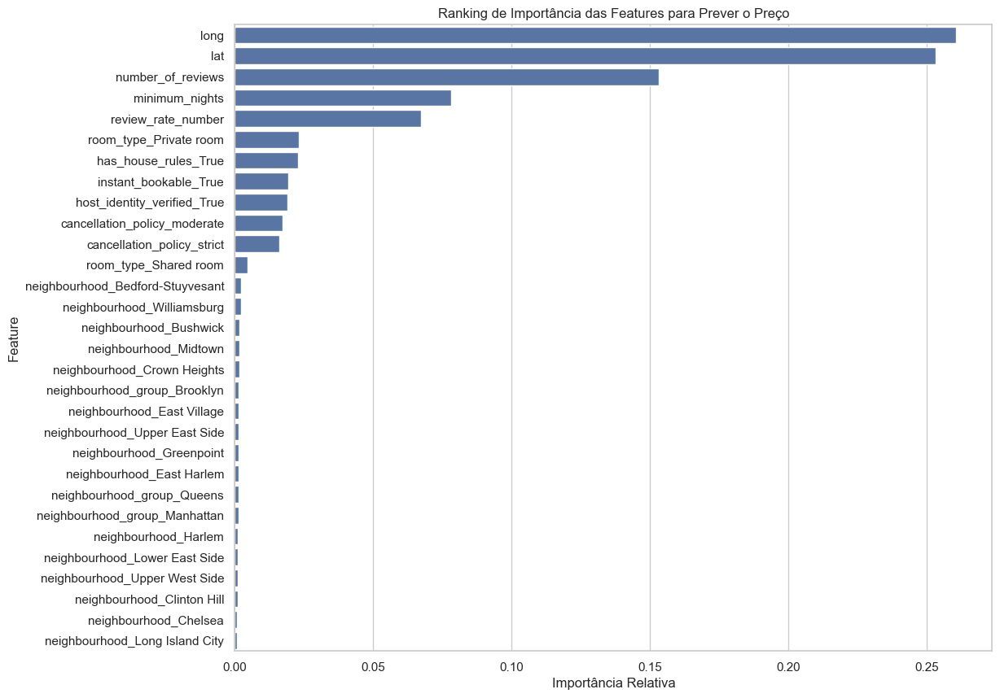

In [22]:
assets_dir = './assets'
model_path = os.path.join(assets_dir, 'feature_importance_model.joblib')
columns_path = os.path.join(assets_dir, 'model_columns.joblib')
zip_path = os.path.join(assets_dir, 'model.zip')

colunas_para_analise = [
    'host_identity_verified', 'neighbourhood_group', 'neighbourhood', 
    'instant_bookable', 'cancellation_policy', 'room_type', 'has_house_rules',
    'lat', 'long', 'minimum_nights', 'number_of_reviews', 'review_rate_number',
    'price' 
]

df_modelo = df[colunas_para_analise].copy()

X = df_modelo.drop('price', axis=1)
y = df_modelo['price']

colunas_categoricas = X.select_dtypes(include=['object', 'bool']).columns
X_encoded = pd.get_dummies(X, columns=colunas_categoricas, drop_first=True)

if not os.path.exists(assets_dir):
    os.makedirs(assets_dir)

if os.path.exists(model_path) and os.path.exists(columns_path):
    print("Carregando modelo e colunas existentes de ./assets...")
    model = joblib.load(model_path)
    model_columns = joblib.load(columns_path)
    X_encoded = X_encoded.reindex(columns=model_columns, fill_value=0)

elif os.path.exists(zip_path):
    print(f"Arquivos de modelo não encontrados, mas '{zip_path}' existe. Descompactando...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(assets_dir)
    print("Descompactação concluída. Carregando modelo e colunas...")
    model = joblib.load(model_path)
    model_columns = joblib.load(columns_path)
    X_encoded = X_encoded.reindex(columns=model_columns, fill_value=0)

else:
    print("Nenhum modelo ou arquivo .zip encontrado. Treinando um novo modelo...")
    model = RandomForestRegressor(n_estimators=50, random_state=42, n_jobs=-1)
    model.fit(X_encoded, y)
    
    print("Salvando o modelo treinado em ./assets...")
    joblib.dump(model, model_path)
    joblib.dump(X_encoded.columns, columns_path)
    
    print(f"Compactando arquivos do modelo em '{zip_path}'...")
    with zipfile.ZipFile(zip_path, 'w') as zip_ref:
        zip_ref.write(model_path, os.path.basename(model_path))
        zip_ref.write(columns_path, os.path.basename(columns_path))
    print("Compactação concluída.")

importances = model.feature_importances_
feature_names = X_encoded.columns

feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

print("\nAs 30 features mais importantes:")
print(feature_importance_df.head(30))

plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(30))
plt.title('Ranking de Importância das Features para Prever o Preço')
plt.xlabel('Importância Relativa')
plt.ylabel('Feature')
plt.show()

A análise revela uma hierarquia clara na importância das features, que podemos agrupar da seguinte forma:

### A Dominância da Geolocalização
As features `long` (longitude) e `lat` (latitude) são, de longe, as mais importantes, somando mais de 51% da importância total (0.26 + 0.25).
**Insight:** Isso confirma o ditado do mercado imobiliário: "localização, localização, localização". A posição geográfica exata de um imóvel é o fator mais decisivo para a formação do seu preço, superando qualquer outra característica. O modelo aprendeu que pequenas mudanças nas coordenadas geográficas levam a variações significativas de preço.

### Métricas de Reputação e Reserva
O segundo grupo de features mais relevantes inclui `number_of_reviews`, `minimum_nights` e `review_rate_number`.
**Insight:** Isso indica que, após a localização, fatores ligados à popularidade (número de avaliações), política de reserva (mínimo de noites) e qualidade percebida (nota de avaliação) são os próximos preditores mais fortes do preço. Imóveis com mais avaliações e notas mais altas tendem a ter preços diferentes.

### Características do Imóvel e Políticas
Features como `room_type_Private room`, `has_house_rules_True`, `instant_bookable_True` e as políticas de cancelamento (`cancellation_policy_moderate`/`strict`) aparecem em seguida.
**Insight:** O tipo de quarto (privado vs. compartilhado) tem um impacto direto e compreensível no preço. Além disso, características que oferecem conveniência e segurança ao hóspede, como a possibilidade de reserva instantânea e a existência de regras da casa, também são fatores relevantes, embora com menor peso.

### O Impacto dos Bairros Específicos
É interessante notar que, embora a localização geral (`lat`/`long`) seja crucial, os bairros específicos (`neighbourhood_...`) aparecem com uma importância individual muito baixa no final da lista.
**Insight:** Isso não significa que os bairros não importam. Pelo contrário, sugere que o modelo encontrou mais poder preditivo nas coordenadas exatas do que em uma categoria ampla como o nome do bairro. A informação contida no nome do bairro já está representada de forma muito mais granular e precisa pelas variáveis `lat` e `long`.

### 4.3 Características Gerais dos Anúncios

Nesta seção, foi realizada uma análise para identificar os nomes de anúncios mais comuns no dataset, com o objetivo de entender os padrões de nomenclatura e a qualidade dos dados nesta coluna.'

#### Top 10 Nomes de Anúncios Mais Comuns

**Metodologia:**

O processo consistiu em contar a frequência de cada valor único na coluna `name` utilizando a função `value_counts()`. Em seguida, os 10 nomes mais frequentes foram selecionados e visualizados em um gráfico de barras horizontais para facilitar a comparação.

**Principais Observações:**

* **Dado Faltante ou Padrão:** O "nome" mais comum, com uma frequência superior a 220 ocorrências, é **"Sem nome informado"**. Isso indica que uma quantidade significativa de anúncios não possui um título personalizado, o que representa uma importante observação sobre a qualidade dos dados desta coluna.
* **Distribuição Assimétrica:** Há uma grande disparidade entre o primeiro colocado e os demais. Enquanto o nome padrão lidera com folga, os outros nove nomes mais comuns têm uma frequência muito menor (todos abaixo de 40), sugerindo que a maioria dos nomes de anúncios é bastante diversificada.
* **Nomes Genéricos:** Vários dos nomes populares são genéricos e descritivos, como "Home away from home", "Private Room" e "Brooklyn Apartment", refletindo o tipo de acomodação oferecida.

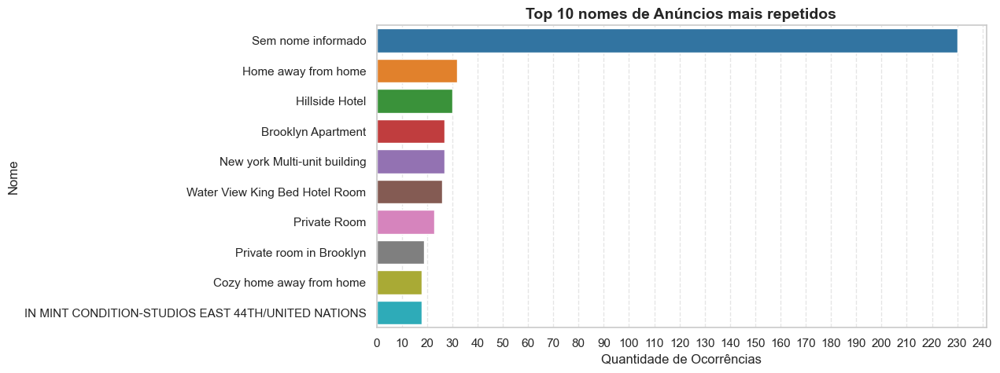

In [23]:
top_names = df['name'].value_counts().head(10)

plt.figure(figsize=(10,5))
ax = sns.barplot(
    x=top_names.values, 
    y=top_names.index, 
    hue=top_names.index,
    dodge=False,
    legend=False,
    palette="tab10"
)

plt.title('Top 10 nomes de Anúncios mais repetidos', fontsize=14, fontweight='bold')
plt.xlabel('Quantidade de Ocorrências', fontsize=12)
plt.ylabel('Nome', fontsize=12)
ax.xaxis.set_major_locator(MaxNLocator(nbins=30))
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.show()

#### Proporção de Nomes de Anúncios Únicos vs. Repetidos 

A análise de frequência revela que muitos nomes de anúncios se repetem. À primeira vista, isso poderia sugerir que se tratam dos mesmos imóveis, mas, como veremos na análise geográfica a seguir, os anúncios com nomes idênticos estão, na verdade, em localidades distintas.

Isso nos leva a concluir que a alta repetição se deve ao uso de nomes genéricos por diferentes anfitriões. Além disso, o problema é potencializado por pequenas variações de formatação, como o uso de letras maiúsculas ou minúsculas (ex: 'Brooklyn Apartment' vs. 'brooklyn apartment'), que são contadas como nomes diferentes.

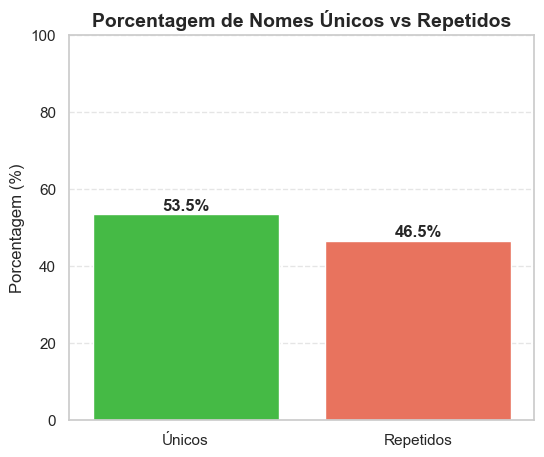

In [24]:
name_counts = df['name'].value_counts()
unique_count = (name_counts == 1).sum()
repeated_count = (name_counts > 1).sum()

cats = ['Únicos', 'Repetidos']
vals = [unique_count / len(name_counts) * 100, repeated_count / len(name_counts) * 100]

plt.figure(figsize=(6,5))
ax = sns.barplot(x=cats, y=vals, hue=cats, dodge=False, legend=False, palette=['limegreen', 'tomato'])

plt.title('Porcentagem de Nomes Únicos vs Repetidos', fontsize=14, fontweight='bold')
plt.ylabel('Porcentagem (%)', fontsize=12)

for i, v in enumerate(vals):
    ax.text(i, v + 1, f"{v:.1f}%", ha='center', fontweight='bold')

plt.ylim(0, 100)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()


#### 4.4 Análise Geográfica

### Identificação dos Bairros presentes

Confirmando que as variações dos nomes dos bairros (ex: 'brooklyn', 'manhattan') foram substituídas com sucesso pelas versões padronizadas durante o ETL.

In [25]:
bairros_unicos = df['neighbourhood_group'].unique()
print(list(bairros_unicos))

['Brooklyn', 'Manhattan', 'Queens', 'Bronx', 'Staten Island']


### Quantidade de Anúncios por Grupo de Bairro

Esta tópico apresenta uma análise da distribuição espacial dos anúncios, quantificando a sua frequência por bairro.

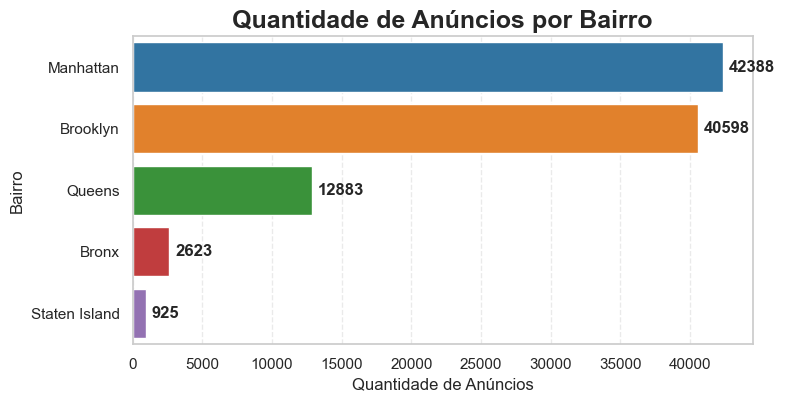

In [26]:
feq = df['neighbourhood_group'].value_counts()

plt.figure(figsize=(8,4))
ax = sns.barplot(
    x=feq.values, 
    y=feq.index, 
    hue=feq.index, 
    dodge=False, 
    legend=False, 
    palette="tab10"
)

plt.title("Quantidade de Anúncios por Bairro", fontsize=18, fontweight='bold')
plt.xlabel('Quantidade de Anúncios', fontsize=12)
plt.ylabel('Bairro', fontsize=12)

for i, v in enumerate(feq.values):
    ax.text(v + feq.max()*0.01, i, str(v), va='center', fontweight='bold')

plt.grid(axis='x', linestyle='--', alpha=0.4)
plt.show()


### Quantidade de Sub-Regiões dentro de um Bairro

Este tópico analisa a composição de cada bairro, contando o número de regiões ou sub-bairros que existem dentro de cada um. O objetivo é usar essa contagem como uma medida da 'grandeza' ou granularidade de cada bairro.

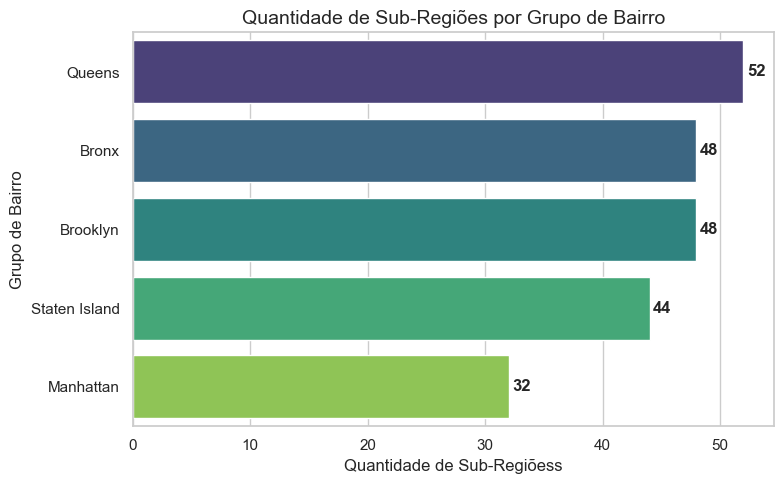

In [27]:
contagem = df.groupby("neighbourhood_group")["neighbourhood"].nunique().reset_index()
contagem.columns = ["Grupo de Bairro", "Qtd. de Sub-Bairros"]
contagem = contagem.sort_values("Qtd. de Sub-Bairros", ascending=False)

plt.figure(figsize=(8,5))
ax = sns.barplot(
    data=contagem,
    x='Qtd. de Sub-Bairros',
    y='Grupo de Bairro',
    hue="Grupo de Bairro",
    dodge=False,
    legend=False,
    palette="viridis"
)

ax.set_title("Quantidade de Sub-Regiões por Grupo de Bairro", fontsize=14)
ax.set_xlabel("Quantidade de Sub-Regiõess", fontsize=12)
ax.set_ylabel("Grupo de Bairro", fontsize=12)

for p in ax.patches:
    width = p.get_width()
    y = p.get_y() + p.get_height() / 2
    ax.text(width + 0.3, y, f"{int(width)}", va="center", ha="left", fontweight='bold')

plt.tight_layout()
plt.show()

### Distribuição Espacial dos Anúncios pelo Planeta

Este tópico analisa a lista de países únicos presentes no dataset. O objetivo é realizar uma verificação de consistência para identificar possíveis erros ou valores inesperados."

A presença de países que não correspondem ao escopo geográfico esperado (por exemplo, um imóvel do 'Brasil' em um dataset que deveria ser apenas dos 'Estados Unidos') indica uma inconsistência nos dados que precisa ser tratada.

Loading formatted geocoded file...


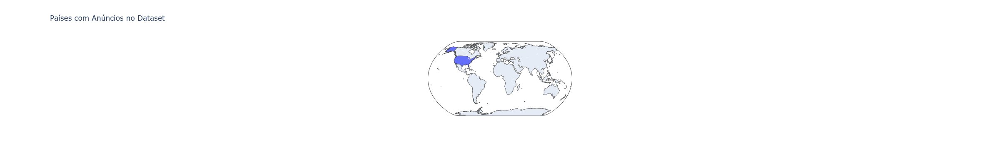

In [28]:
coords = list(zip(df['lat'], df['long']))
results = rg.search(coords)
unique_country_codes = {result['cc'] for result in results}

def get_iso3_code(code_2_letter):
    try:
        return pycountry.countries.get(alpha_2=code_2_letter).alpha_3
    except AttributeError:
        return None

def get_country_name(code_2_letter):
    try:
        return pycountry.countries.get(alpha_2=code_2_letter).name
    except AttributeError:
        return None

df_mapa = pd.DataFrame({'code_2': list(unique_country_codes)})
df_mapa['Codigo_ISO'] = df_mapa['code_2'].apply(get_iso3_code)
df_mapa['Pais'] = df_mapa['code_2'].apply(get_country_name)
df_mapa.dropna(inplace=True)

fig = pxa.choropleth(
    df_mapa,
    locations="Codigo_ISO",
    color="Pais",
    hover_name="Pais",
    projection="natural earth",
    title="Países com Anúncios no Dataset"
)

fig.update_layout(showlegend=False)
fig.show()

### Distribuição Espacial e de Densidade dos Anúncios pelo Estados Unidos

Nesta seção, analisamos a distribuição geográfica dos anúncios para entender onde eles se concentram na cidade de Nova York. Foram utilizadas duas visualizações complementares: um mapa de calor para mostrar a densidade e um gráfico de dispersão para detalhar a localização por região.

---

#### Gráfico 1: Distribuição por Região (Scatter Plot)

O segundo gráfico, um mapa de dispersão (*scatter plot*), oferece uma visão mais detalhada, plotando a localização exata de cada anúncio e colorindo-os de acordo com sua região (`Neighbourhood Group`).

**Inferências a partir do Scatter Plot:**
* **Confirmação da Concentração:** Este gráfico confirma as observações do heatmap e nos permite atribuir as "manchas de calor" a regiões específicas.
* **Manhattan (Laranja):** É a região mais densamente preenchida de ponta a ponta, validando sua posição como o epicentro dos anúncios.
* **Brooklyn (Azul):** Possui um volume altíssimo de anúncios, formando uma grande massa densa, especialmente na parte que faz fronteira com Manhattan.
* **Queens (Verde) e Bronx (Vermelho):** Apresentam uma distribuição mais espalhada (esparsa) em comparação com Manhattan e Brooklyn.
* **Staten Island (Roxo):** É visivelmente a região com a menor quantidade e a menor densidade de anúncios, confirmando a inferência do heatmap.

---

#### Gráfico 2: Mapa de Densidade (Heatmap)

O primeiro gráfico é um mapa de calor (*heatmap*) que ilustra a **concentração** de anúncios. As cores mais quentes (vermelho e amarelo) representam áreas com uma alta densidade de imóveis listados.

**Inferências a partir do Heatmap:**
* Fica evidente que a atividade de anúncios **não é uniforme** pela cidade.
* A maior concentração de imóveis se encontra claramente na ilha de **Manhattan** e nas áreas do **Brooklyn** mais próximas a ela.
* **Queens** também mostra uma densidade considerável, embora mais espalhada que a do Brooklyn.
* Uma pequena "ilha de calor" isolada ao sul corresponde a **Staten Island**, indicando uma concentração muito menor.

### Mapa de Densidade

Citado acima.

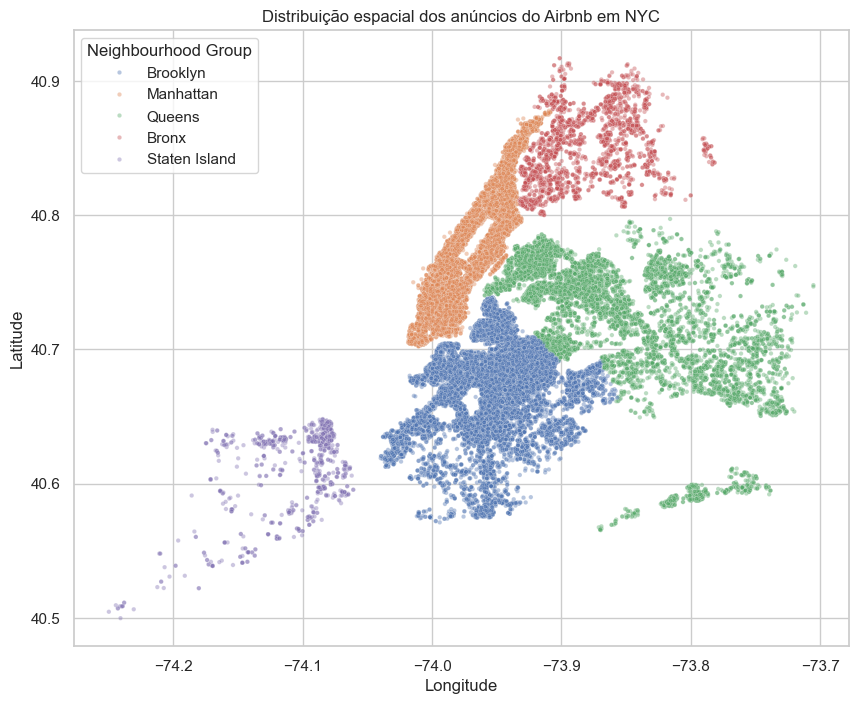

In [29]:
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="long", 
    y="lat", 
    data=df, 
    hue="neighbourhood_group",
    alpha=0.4,
    s=10
)

plt.title("Distribuição espacial dos anúncios do Airbnb em NYC")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Neighbourhood Group")
plt.show()


### Distribuição por Região

Citado acima.

In [30]:
map_data = df.dropna(subset=['lat', 'long'])

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

heat_data = [[row['lat'], row['long']] for index, row in map_data.iterrows()]
HeatMap(heat_data, radius=20).add_to(nyc_map)

title_html = '''
             <h3 align="center" style="font-size:16px"><b>Densidade de Anúncios do Airbnb em NYC</b></h3>
             '''
nyc_map.get_root().html.add_child(folium.Element(title_html))

nyc_map

### Distribuição Espacial dos Anúncios por Sub-Região

Após a análise geral por região, esta seção aprofunda a investigação, visualizando a distribuição dos anúncios em um nível mais granular: a sub-região (ou neighbourhood). O mapa a seguir mostra a concentração de imóveis em cada uma dessas áreas menores.

Uma das observações mais importantes deste mapa é a identificação de "vazios" na distribuição, áreas com poucos ou nenhum anúncio. A análise desses locais serve como uma importante validação de coerência dos nossos dados, pois eles correspondem a áreas onde não esperamos encontrar anúncios, como:

- Aeroportos (JFK, LaGuardia)

- Grandes Parques (Central Park, Prospect Park)

In [31]:
geojson_path = "assets/nyc.geojson"
regioes = gpd.read_file(geojson_path).to_crs("EPSG:4326").reset_index().rename(columns={"index":"id_poligono"})

pontos = df.dropna(subset=["lat","long"])[["lat","long"]]
pontos = gpd.GeoDataFrame(pontos, geometry=gpd.points_from_xy(pontos["long"], pontos["lat"]), crs="EPSG:4326")

juncao = gpd.sjoin(pontos, regioes, how="inner", predicate="within")
contagem = juncao.groupby("id_poligono").size().reset_index(name="anuncios")

regioes = regioes.merge(contagem, on="id_poligono", how="left")
regioes["anuncios"] = regioes["anuncios"].fillna(0).astype(int)

boroughs_validos = sorted(regioes.loc[regioes["anuncios"]>0, "BoroName"].dropna().unique())
cmap = plt.colormaps.get_cmap("tab10")
cores_borough = {b: mcolors.rgb2hex(cmap(i/len(boroughs_validos))) for i, b in enumerate(boroughs_validos)}

def estilo(f):
    a = f["properties"].get("anuncios", 0)
    b = f["properties"].get("BoroName")
    if a>0 and b in cores_borough:
        return {"fillColor": cores_borough[b], "color": "black", "weight": 1, "fillOpacity": 0.7, "opacity": 1}
    return {"fillColor": "transparent", "color": "transparent", "weight": 0, "fillOpacity": 0, "opacity": 0}

def destaque(f):
    a = f["properties"].get("anuncios", 0)
    b = f["properties"].get("BoroName")
    cor = cores_borough.get(b, "#cccccc")
    return {"weight": 3, "fillColor": cor, "fillOpacity": 0.9 if a>0 else 0}

mapa = folium.Map(location=[40.7128, -74.0060], zoom_start=11)
folium.GeoJson(
    regioes,
    tooltip=folium.GeoJsonTooltip(
        fields=[c for c in ["BoroName","NTAName","anuncios"] if c in regioes.columns],
        aliases=["Bairro","Sub-região","Anúncios"]
    ),
    style_function=estilo,
    highlight_function=destaque
).add_to(mapa)
mapa


## 4.3 Tipos de Acomodação

### Tipos presentes no Dataset

Validando os valores da coluna de tipo de quarto para garantir a consistência e identificar possíveis erros, como categorias inesperadas ou erros de digitação.

In [32]:
list(df["room_type"].unique())

['Private room', 'Entire home/apt', 'Shared room', 'Hotel room']

### Distribuição Percentual dos Tipos de Quarto no Dataset inteiro

O gráfico de pizza a seguir apresenta a distribuição percentual dos diferentes tipos de acomodações disponíveis. Esta visualização ajuda a compreender a popularidade e a oferta de cada categoria no mercado.

Fica evidente a dominância de duas categorias principais:

- Entire home/apt (casa/apartamento inteiro) compõe a maior parte das listagens, com 52.4%.

- Private room (quarto privado) representa a segunda maior fatia, com 45.3%.

Juntas, essas duas modalidades somam 97.7% do total de ofertas. As categorias Shared room (2.2%) e Hotel room (0.1%) têm uma presença significativamente menor, e são destacadas no gráfico para facilitar a sua visualização.

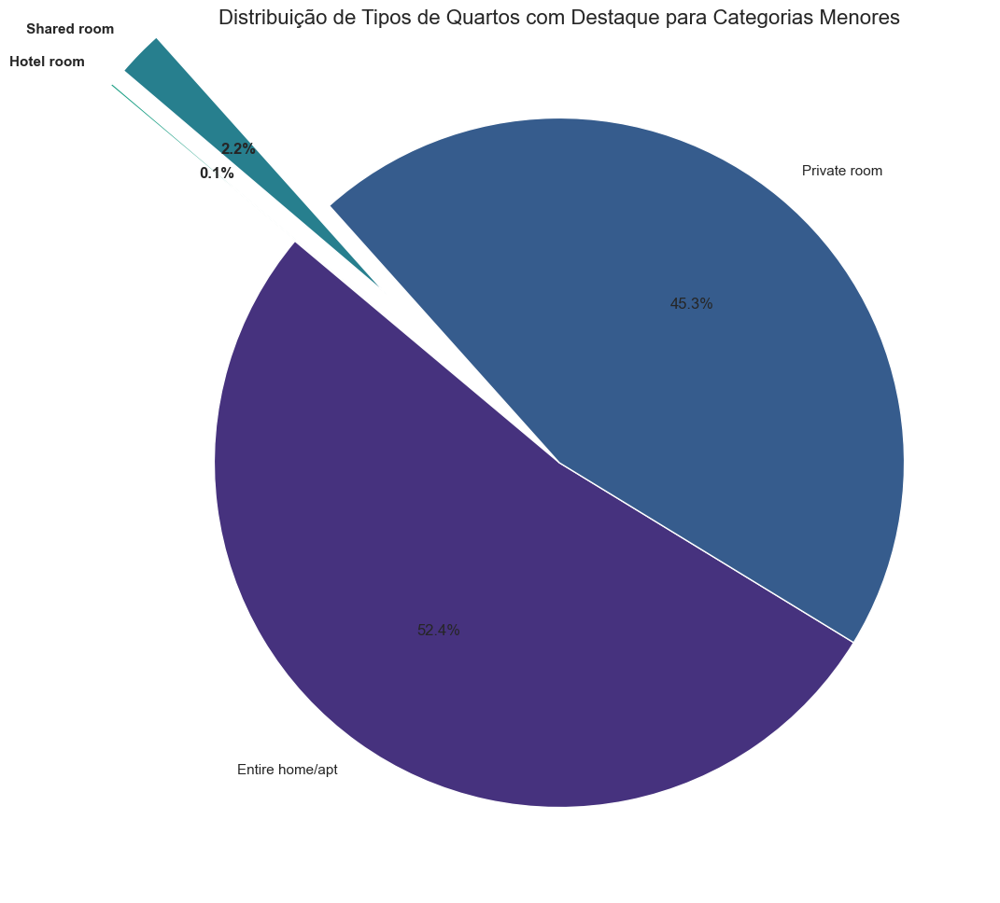

In [33]:
room_type_counts = df['room_type'].value_counts()
labels = room_type_counts.index

limite_percentual = 10.0

porcentagens = 100. * room_type_counts / room_type_counts.sum()

explode = [0.7 if p < limite_percentual else 0 for p in porcentagens]

sns.set_style("whitegrid")
sns.set_palette("viridis")
plt.figure(figsize=(12, 12))

wedges, texts, autotexts = plt.pie(
    room_type_counts,
    autopct='%1.1f%%',
    startangle=140,
    labels=labels,
    explode=explode
)

for i, p in enumerate(porcentagens):
    if p < limite_percentual:
        texts[i].set_fontweight('bold')
        autotexts[i].set_fontweight('bold')

plt.title('Distribuição de Tipos de Quartos com Destaque para Categorias Menores', fontsize=16)
plt.ylabel('')
plt.show()

### Distribuição Percentual dos Tipos de Quarto por Grupo de Bairro

O gráfico a seguir ilustra como a oferta de diferentes tipos de quarto se distribui percentualmente dentro de cada região. Cada barra representa 100% das listagens de uma região, mostrando a composição interna.

A análise revela padrões distintos entre as localidades:

- Manhattan: É a região com a maior dominância de apartamentos/casas inteiras (Entire home/apt), que compõem 60.5% de suas listagens.

- Bronx e Queens: Apresentam um perfil oposto, onde os quartos privados (Private room) são a maioria, representando 58.0% e 58.3% das ofertas, respectivamente.

- Brooklyn e Staten Island: Mostram um equilíbrio notável, com uma divisão quase igual entre Entire home/apt e Private room.

- Categorias Menores: Em todas as regiões, Shared room e Hotel room representam uma pequena fração do total de acomodações disponíveis.

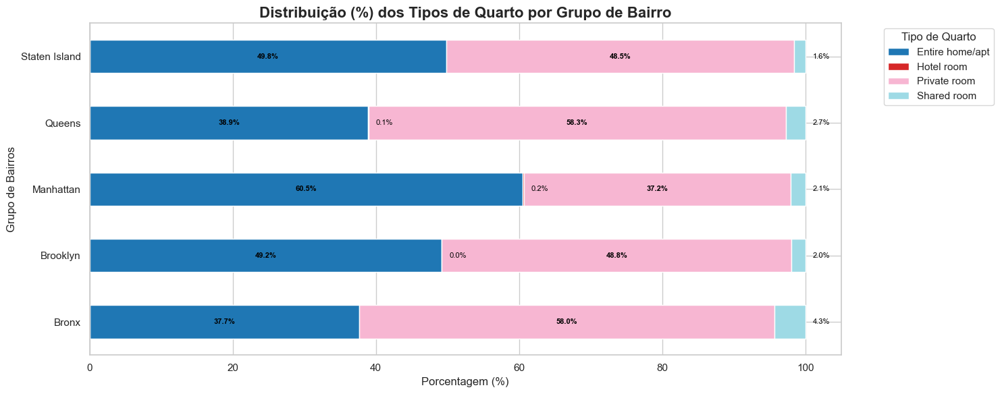

In [34]:
freq = df.groupby(["neighbourhood_group", "room_type"]).size().reset_index(name="count")
freq["percent"] = freq.groupby("neighbourhood_group")["count"].transform(lambda x: x / x.sum() * 100)

pivot = freq.pivot(index="neighbourhood_group", columns="room_type", values="percent").fillna(0)

ax = pivot.plot(
    kind="barh",
    stacked=True,
    figsize=(15, 6),
    colormap="tab20"
)

plt.title("Distribuição (%) dos Tipos de Quarto por Grupo de Bairro", fontsize=16, fontweight="bold")
plt.xlabel("Porcentagem (%)", fontsize=12)
plt.ylabel("Grupo de Bairros", fontsize=12)
plt.legend(title="Tipo de Quarto", bbox_to_anchor=(1.05, 1), loc="upper left")

for bar in ax.patches:
    width = bar.get_width()
    if width > 0:
        x = bar.get_x() + width / 2
        y = bar.get_y() + bar.get_height() / 2
        label = f"{width:.1f}%"
        if width > 8:
            ax.text(x, y, label, ha="center", va="center", fontsize=8, color="black", fontweight="bold")
        else:
            ax.text(bar.get_x() + width + 1, y, label, ha="left", va="center", fontsize=8, color="black")

plt.tight_layout()
plt.show()


## 4.4 Análise de Preços

### Distribuição do preço ao longo do Dataset

O gráfico de dispersão (scatter plot) a seguir visualiza a relação entre o preço de cada anúncio e a sua posição (índice) no dataset.

A principal observação é a distribuição uniforme dos pontos, que se assemelham a uma "nuvem" retangular sem padrões ou tendências. Isso é um excelente sinal, pois indica que o preço não tem nenhuma correlação com a ordem dos dados no arquivo. Em outras palavras, a posição de um anúncio no dataset não nos diz nada sobre seu preço.

Além disso, como bem observado, as fronteiras de preço são muito bem definidas, com um limite superior claro em $1200. A ausência de outliers e esse corte abrupto sugerem fortemente que os dados de preço foram pré-processados, filtrados ou "clipados" nesta faixa de valores durante a coleta.

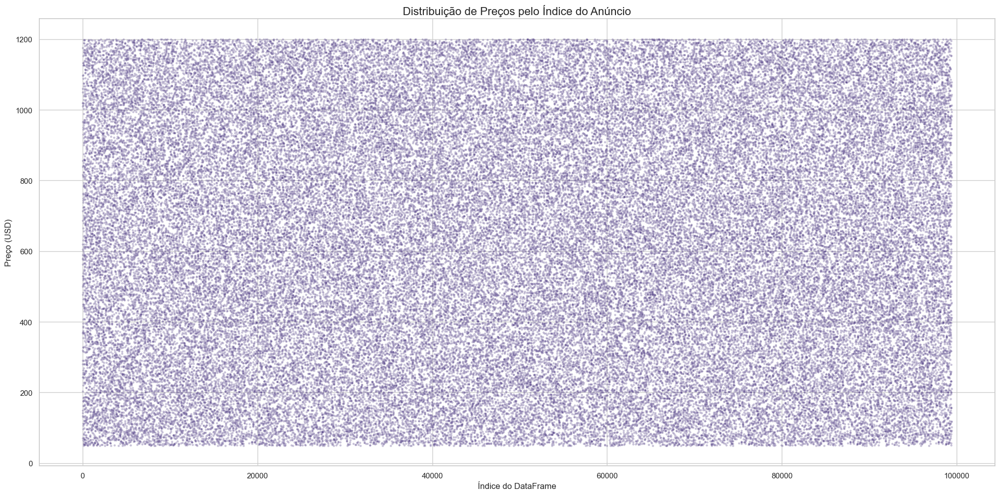

In [35]:
plt.figure(figsize=(20, 10))

ax = sns.scatterplot(
    x=df.index,
    y=df['price'],
    alpha=0.3,
    s=10
)

ax.set_title('Distribuição de Preços pelo Índice do Anúncio', fontsize=16)
ax.set_xlabel('Índice do DataFrame', fontsize=12)
ax.set_ylabel('Preço (USD)', fontsize=12)
ax.grid(True)

plt.tight_layout()
plt.show()

### Distribuição do preço ao longo do Dataset por histograma

**Confirmação da Distribuição Uniforme de Preços**

Este histograma confirma a análise anterior e oferece uma visão clara da distribuição de preços. Como observado, as barras do histograma têm alturas muito semelhantes, formando um platô. Este padrão é a assinatura de uma distribuição uniforme.

**O que isso significa?**

Isso indica que, dentro do intervalo analisado (aproximadamente de $50 a $1200), cada faixa de preço tem praticamente a mesma quantidade de anúncios. Não existe um preço "típico" ou mais comum; todos os valores são igualmente representados nos dados. Uma distribuição tão perfeitamente uniforme é rara em dados do mundo real, o que reforça a hipótese de que o dataset foi filtrado ou amostrado para ter essa característica.

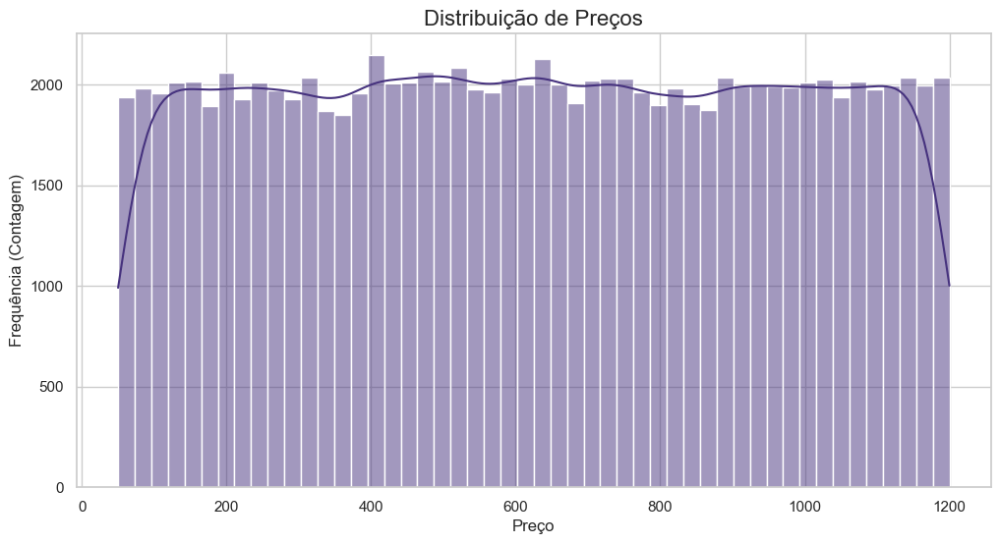

In [36]:
plt.figure(figsize=(12, 6))

sns.histplot(df['price'], kde=True, bins=50)

plt.title('Distribuição de Preços', fontsize=16)
plt.xlabel('Preço', fontsize=12)
plt.ylabel('Frequência (Contagem)', fontsize=12)
plt.show()

### Preço Médio por Região, detalhado por Tipo de Quarto

O gráfico a seguir detalha o preço médio das acomodações, segmentado por tipo de quarto e por região. A análise permite comparar os valores médios entre as diferentes categorias e localidades.Com isso, podemos observar que Em todas as regiões, o preço médio de um Entire home/apt (apartamento/casa inteira) é consistentemente superior ao de um Private room (quarto privado) e a região do Bronx não apresenta dados para a categoria Hotel room.

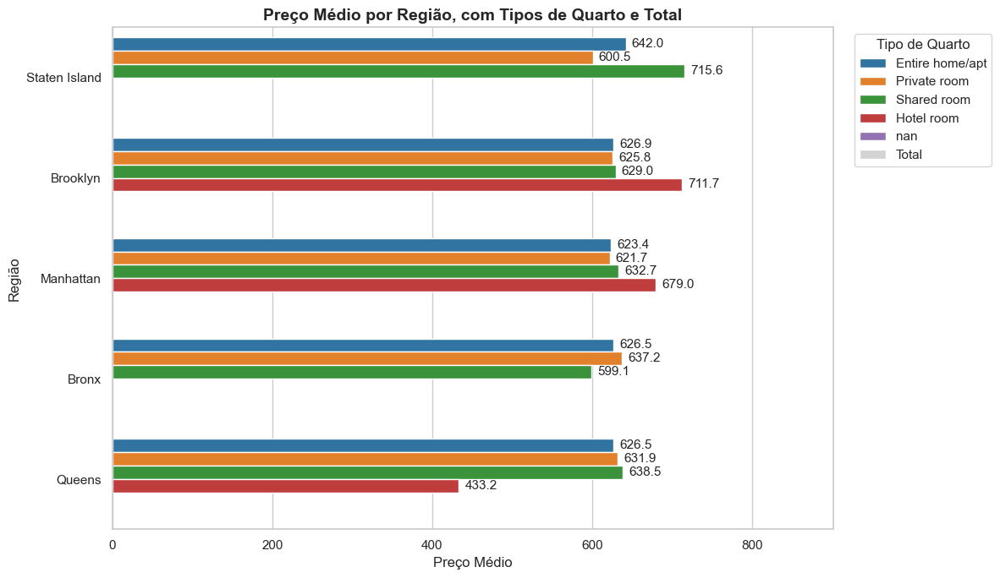

In [37]:
preco_por_tipo = df.groupby(["neighbourhood_group","room_type"])["price"].mean().reset_index(name="PrecoMedio")
preco_total = df.groupby("neighbourhood_group")["price"].mean().reset_index(name="PrecoMedio").assign(**{"room type":"Total"})
tabela = pd.concat([preco_por_tipo, preco_total], ignore_index=True)

ordem_regioes = tabela.groupby("neighbourhood_group")["PrecoMedio"].mean().sort_values(ascending=False).index.tolist()
ordem_tipos = [t for t in tabela["room_type"].unique() if t!="Total"] + ["Total"]
cores = {**dict(zip(ordem_tipos[:-1], sns.color_palette("tab10", len(ordem_tipos)-1))), "Total":"lightgrey"}

plt.figure(figsize=(12,7))
ax = sns.barplot(data=tabela, x="PrecoMedio", y="neighbourhood_group",
                 hue="room_type", hue_order=ordem_tipos, order=ordem_regioes, dodge=True, palette=cores)

for container in ax.containers:
    for barra in container:
        valor = barra.get_width()
        if valor>0: 
            ax.text(valor+0.01*ax.get_xlim()[1], barra.get_y()+barra.get_height()/2, f"{valor:.1f}", va="center", fontsize=11)

ax.set_title("Preço Médio por Região, com Tipos de Quarto e Total", fontsize=14, fontweight="bold")
ax.set_xlabel("Preço Médio"); ax.set_ylabel("Região")
ax.legend(title="Tipo de Quarto", bbox_to_anchor=(1.02,1), loc="upper left")
ax.set_xlim(0, ax.get_xlim()[1]*1.2)
plt.tight_layout(); plt.show()


### Análise da Distribuição de Preços por Região e Tipo de Quarto

---

#### Análise com o Gráfico de Violino (Violin Plot)

O gráfico de violino apresentado ilustra a distribuição dos preços de acomodações (em USD) em cinco diferentes regiões de Nova York (`Brooklyn`, `Manhattan`, `Queens`, `Bronx` e `Staten Island`), segmentado por quatro tipos de quarto: `Private room`, `Entire home/apt`, `Shared room` e `Hotel room`.

Ao analisarmos esse gráfico, observamos que **`Manhattan`** se destaca consistentemente como a região com os preços mais elevados em todas as categorias de acomodação.
* **`Brooklyn` e `Queens`:** Apresentam uma faixa de preço intermediária.
* **`Bronx` e `Staten Island`:** São as regiões mais acessíveis. A distribuição de preços é mais compacta e concentrada em valores mais baixos, especialmente quando comparadas a `Manhattan`.

---

#### Análise com o Gráfico Box Plot

Enquanto o gráfico de violino é excelente para ver a forma geral da distribuição dos preços, o box plot nos permite analisar com mais precisão a **mediana**, a **variabilidade** e, crucialmente, a presença de **outliers**.

* **Confirmação das Medianas:** As medianas (a linha central nas caixas) reforçam a conclusão anterior. **`Manhattan`** consistentemente apresenta os preços medianos mais altos para as categorias "Private room" e "Entire home/apt".

* **Variabilidade dos Preços (Tamanho da Caixa):** Podemos observar a faixa de preço dos 50% centrais dos dados pelo tamanho das caixas (o intervalo interquartil ou IQR). Nota-se que `Entire home/apt` e `Private room` geralmente possuem uma grande variabilidade de preços (caixas mais altas). Em contrapartida, **`Shared room` tem preços muito mais consistentes e baixos**, com caixas bem menores.

* **Detecção de Outliers:** A principal vantagem deste gráfico é a identificação clara de valores atípicos. É possível notar dois **outliers** na categoria **`Shared room` em `Queens`**, indicando acomodações com preços muito acima do esperado para esse tipo de quarto naquela região. Esses poderiam ser erros de dados ou listagens muito especiais que merecem uma investigação à parte.

* **Insights Específicos:** Em **`Staten Island`**, a categoria `Hotel room` se destaca com uma faixa de preço elevada e ampla, contrastando fortemente com os outros tipos de aluguel mais acessíveis na mesma região, que se concentram na parte inferior do gráfico.

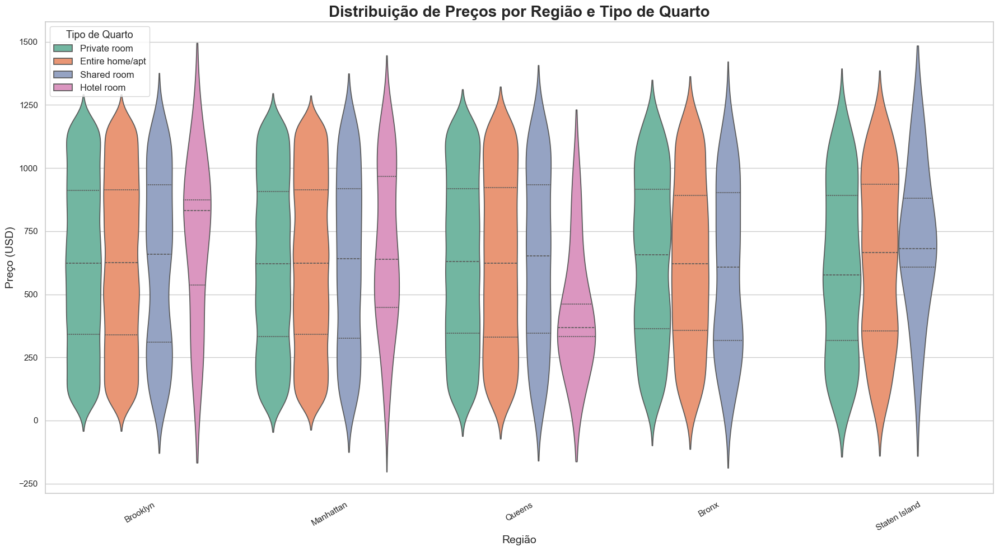

In [38]:
plt.figure(figsize=(18, 10))

ax = sns.violinplot(
    data=df,
    x="neighbourhood_group",
    y="price",
    hue="room_type",
    palette="Set2",
    inner="quartiles",
    dodge=True 
)

ax.set_title("Distribuição de Preços por Região e Tipo de Quarto", fontsize=20, fontweight="bold")
ax.set_xlabel("Região", fontsize=14)
ax.set_ylabel("Preço (USD)", fontsize=14)

plt.legend(title="Tipo de Quarto", fontsize=12, title_fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


## Distribuição de Preços por Região e Tipo de Quarto por BoxPlot

Citado acima.

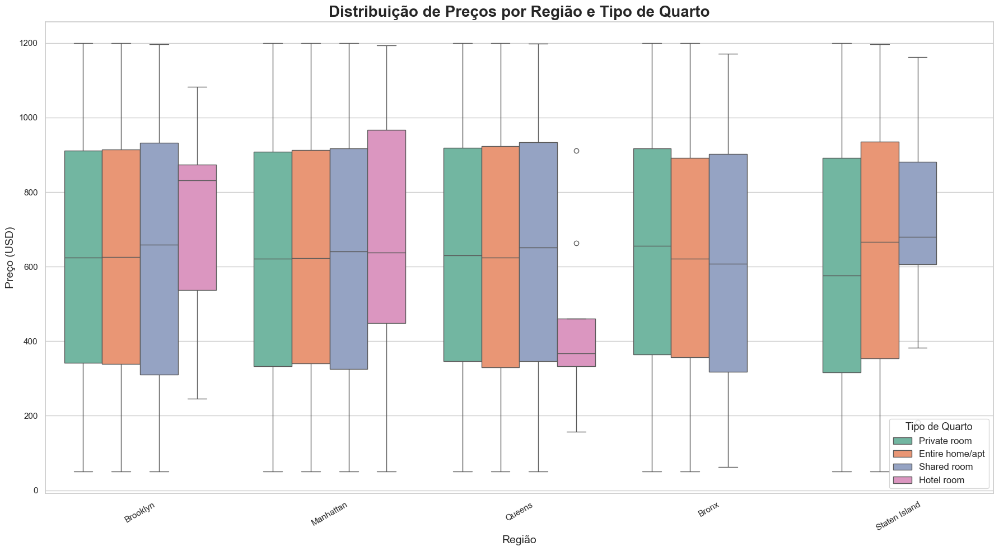

In [39]:
plt.figure(figsize=(18, 10))

ax = sns.boxplot(
    data=df,
    x="neighbourhood_group",
    y="price",
    hue="room_type",
    palette="Set2"
)

ax.set_title("Distribuição de Preços por Região e Tipo de Quarto", fontsize=20, fontweight="bold")
ax.set_xlabel("Região", fontsize=14)
ax.set_ylabel("Preço (USD)", fontsize=14)

plt.legend(title="Tipo de Quarto", fontsize=12, title_fontsize=13)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

### Relação entre Preço e Popularidade (Número de Avaliações)

Nesta etapa, o objetivo é investigar a correlação entre o preço dos aluguéis e sua popularidade, utilizando o número total de avaliações (`number_of_reviews`) como um indicador de popularidade.

Primeiramente, os dados são enriquecidos com uma nova variável categórica, `frequencia_reviews`. Essa coluna é criada a partir da segmentação da métrica `reviews_per_month` em três faixas: "Baixa Frequência", "Média Frequência" e "Alta Frequência". Essa categorização ajuda a adicionar uma nova dimensão à análise.

Em seguida, um gráfico de dispersão (`scatterplot`) é utilizado para visualizar a relação entre as variáveis. No gráfico:
- Eixo X: Representa o `price`.
- Eixo Y: Representa o `number_of_reviews`.
- Cor: Distingue o `neighbourhood_group`.
- Formato do Ponto: Indica a `frequencia_reviews`.

Essa visualização permite analisar como o preço se relaciona com a popularidade, ao mesmo tempo que se observa a influência da localização e da frequência com que o imóvel é avaliado.

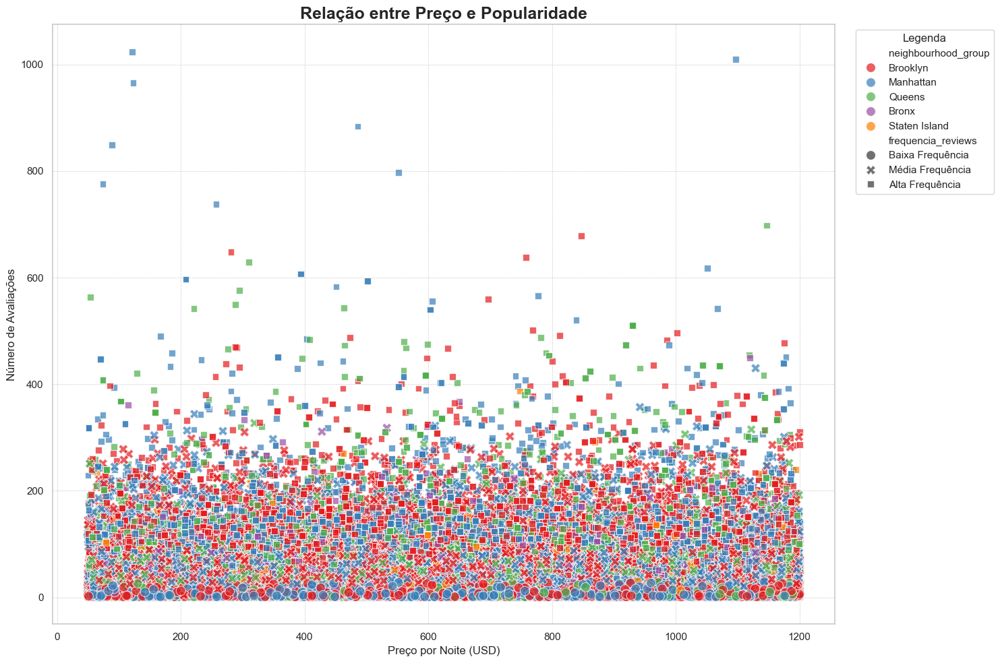

In [40]:
bins = [0, 1, 3, float('inf')]
labels = ['Baixa Frequência', 'Média Frequência', 'Alta Frequência']
df['frequencia_reviews'] = pd.cut(df['reviews_per_month'], bins=bins, labels=labels, right=False)

plt.figure(figsize=(15, 10))
ax = sns.scatterplot(
    data=df,
    x='price',
    y='number_of_reviews',
    hue='neighbourhood_group',
    style='frequencia_reviews',
    palette='Set1',
    alpha=0.7,
    s=100
)

ax.set_title('Relação entre Preço e Popularidade', fontsize=18, fontweight='bold')
ax.set_xlabel('Preço por Noite (USD)', fontsize=12)
ax.set_ylabel('Número de Avaliações', fontsize=12)
ax.legend(title='Legenda', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

### Análise de Preço vs. Mínimo de Noites

Esta análise explora a relação entre o preço, a exigência de um número mínimo de noites, a região e o tipo de quarto oferecido.

Antes da visualização, fazemos duas etapas de preparação, são elas:
1.  Filtragem: os dados são filtrados para remover quaisquer registros onde o `price` ou o `minimum_nights` sejam iguais a zero. Isso garante que apenas anúncios válidos e ativos sejam considerados.
2.  Amostragem: para evitar a sobreposição de pontos e garantir uma visualização mais clara, uma amostra aleatória de 10.000 anúncios é selecionada do conjunto de dados filtrado.

Um gráfico de dispersão (`scatterplot`) é gerado para mapear as diferentes variáveis:
- Eixo X: Representa o `minimum_nights`.
- Eixo Y: Representa o `price`.
- Cor: Diferencia o `neighbourhood_group`.
- Formato do Ponto**: Indica o `room_type`.

O gráfico resultante permite identificar padrões entre essas quatro dimensões, ajudando a responder perguntas como: "Regiões mais caras exigem um mínimo de noites maior?" ou "O tipo de quarto influencia a relação preço e mínimo de noites?".

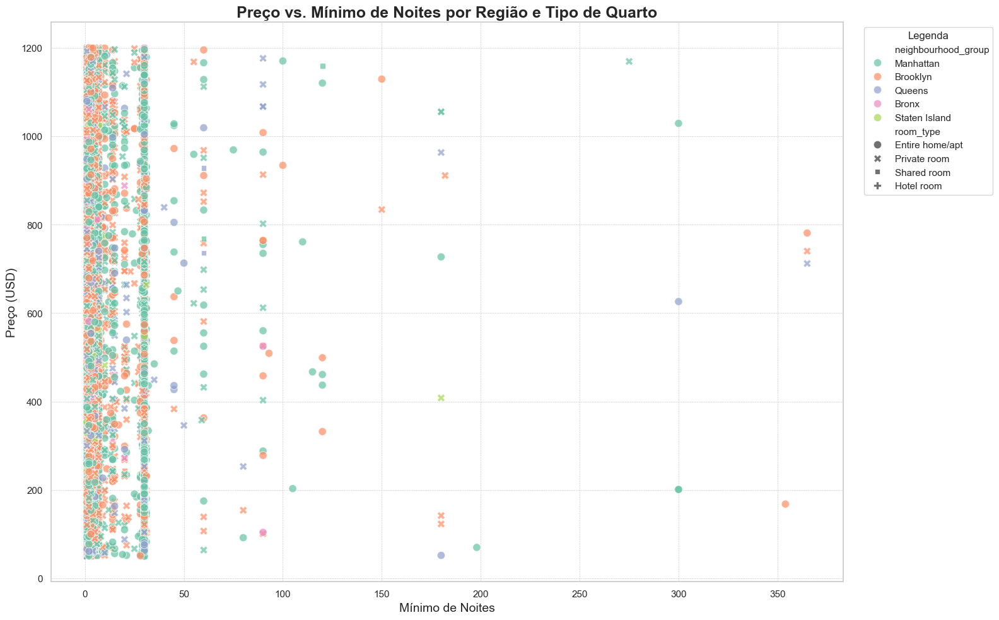

In [41]:
df_plot = df[(df['minimum_nights'] > 0) & (df['price'] > 0)].copy()

df_amostra = df_plot.sample(n=10000, random_state=42)

plt.figure(figsize=(16, 10))

ax = sns.scatterplot(
    data=df_amostra,
    x='minimum_nights',
    y='price',
    hue='neighbourhood_group',
    style='room_type',
    palette='Set2',
    alpha=0.7,
    s=80
)

ax.set_title('Preço vs. Mínimo de Noites por Região e Tipo de Quarto', fontsize=18, fontweight='bold')
ax.set_xlabel('Mínimo de Noites', fontsize=14)
ax.set_ylabel('Preço (USD)', fontsize=14)

ax.legend(title='Legenda', bbox_to_anchor=(1.02, 1), loc='upper left')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

### Relação entre Preço e Taxa de serviço

O gráfico de dispersão (*scatter plot*) entre `price` e `service_fee` revela uma relação **perfeitamente linear**, e não apenas uma correlação forte. Todos os pontos formam uma linha reta, sugerindo que uma variável é calculada diretamente a partir da outra, como em uma função afim (`y = ax + b`).

Para quantificar essa relação exata, aplicamos uma Regressão Linear em ambos os sentidos:

* **Taxa em função do Preço:** A regressão resultou na fórmula `service_fee ≈ 0.2000 * price`. Isso confirma que a **taxa de serviço corresponde a exatamente 20%** do preço do anúncio.

* **Preço em função da Taxa:** A análise inversa nos deu a fórmula `price ≈ 4.9997 * service_fee`. O coeficiente `4.9997` é praticamente 5, que é o inverso de `0.2` (pois `1 / 0.2 = 5`), validando matematicamente nossa conclusão.

**Conclusão:** A `service_fee` não é uma variável independente, mas sim uma **variável derivada**, calculada a partir de uma regra de negócio fixa de 20% sobre o `price`.

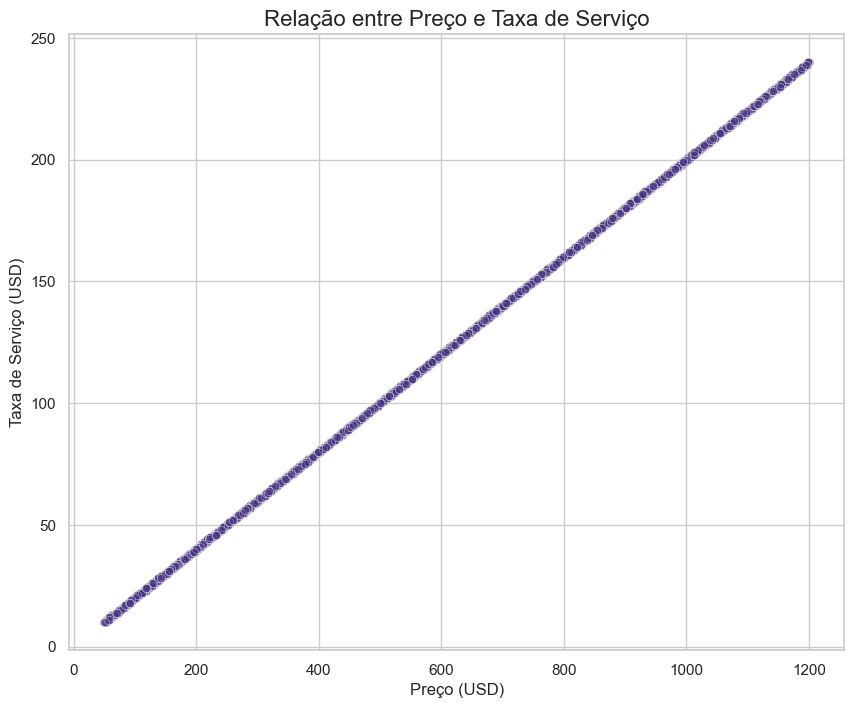

In [42]:
plt.figure(figsize=(10, 8))

sns.scatterplot(
    data=df,
    x='price',
    y='service_fee',
    alpha=0.5
)

plt.title('Relação entre Preço e Taxa de Serviço', fontsize=16)
plt.xlabel('Preço (USD)', fontsize=12)
plt.ylabel('Taxa de Serviço (USD)', fontsize=12)
plt.grid(True)

plt.show()

### Regressão de 'service_fee'

Citado acima.

In [43]:
X = df['price'].values.reshape(-1, 1)
y = df['service_fee'].values

model = LinearRegression()
model.fit(X, y)

coeficiente = model.coef_[0]
intercepto = model.intercept_

print(f"service_fee ≈ ({coeficiente:.4f} * price) + {intercepto:.4f}")

service_fee ≈ (0.2000 * price) + -0.0044


### Regressão de 'price'

Citado acima.

In [44]:
X = df['service_fee'].values.reshape(-1, 1)
y = df['price'].values

model = LinearRegression()
model.fit(X, y)

coeficiente = model.coef_[0]
intercepto = model.intercept_

print(f"price ≈ ({coeficiente:.4f} * service_fee) + {intercepto:.4f}")

price ≈ (4.9997 * service_fee) + 0.0335


## 4.5 Políticas e Comportamento

Para cancelar uma reserva, sabemos que as regras para fazê-lo podem ser "estritas", "moderadas" ou "flexíveis". No entanto, não sabemos o que isso significa. O que quer dizer que as regras para cancelar um quarto são flexíveis? Qual a diferença de flexível para moderada?

O Gráfico abaixo visa demonstrar a distribuição das políticas de cancelamento entre os anúncios.

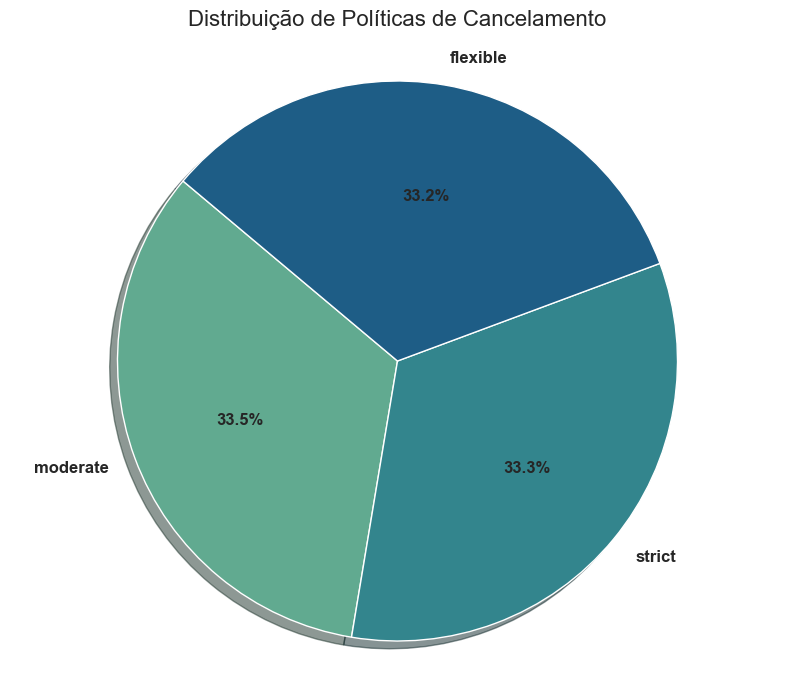

In [45]:
cancellation_counts = df['cancellation_policy'].dropna().value_counts()

sns.set_style("whitegrid")
plt.figure(figsize=(10, 8))

colors = sns.color_palette('crest', len(cancellation_counts))

plt.pie(
    cancellation_counts,
    labels=cancellation_counts.index,
    autopct='%1.1f%%',  
    startangle=140,      
    colors=colors,
    shadow=True,         
    textprops={'fontsize': 12, 'weight': 'bold'} 
)

plt.title('Distribuição de Políticas de Cancelamento', fontsize=16, pad=20)
plt.ylabel('') 
plt.axis('equal')  

plt.show()


Observamos que as três principais políticas de cancelamento – flexible, moderate e strict – estão distribuídas de maneira equilibrada, cada uma correspondendo a aproximadamente um terço do total de anúncios.

- Strict (Rígida): 33.3%
- Moderate (Moderada): 33.5%
- Flexible (Flexível): 33.2%

## Regras da casa Vs Avaliações

Para entender se a clareza nas regras influencia a satisfação do hóspede, investigamos se existe uma correlação entre a presença de regras da casa **(`house_rules`)** e as notas de avaliação. 
Dividimos os anúncios em dois grupos, com e sem regras definidas e comparamos a nota média de avaliação de cada um. 
O gráfico a seguir ilustra essa comparação, buscando identificar se anfitriões que definem regras tendem a receber notas mais altas.



## Regras da Casa

Para entender a frequência com que os anfitriões definem essas diretrizes, analisamos a coluna house_rules, verificando a proporção de anúncios que possuem este campo preenchido (não nulo) em comparação com os que não possuem (nulo).

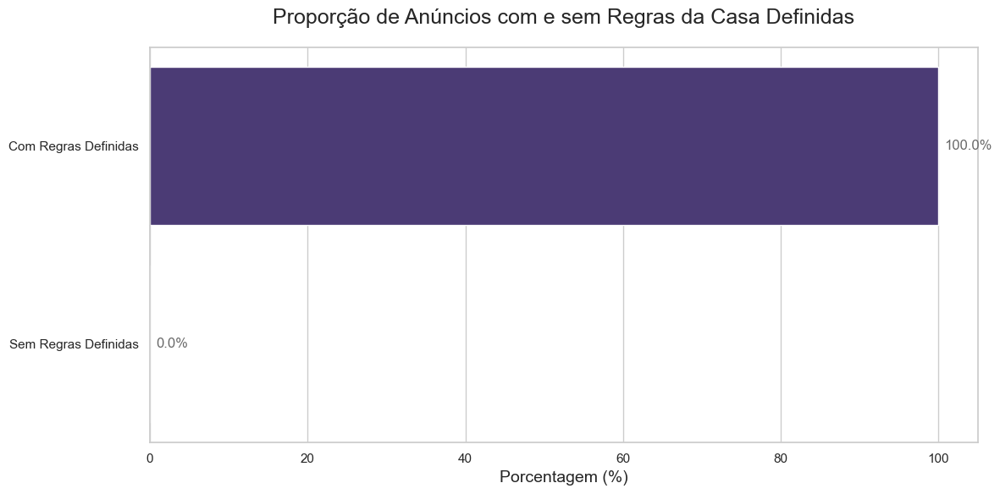

In [46]:
df_temp = df.copy()

df_temp['has_house_rules'] = df_temp['house_rules'].notna().map({True: 'Com Regras Definidas', False: 'Sem Regras Definidas'})
counts = df_temp['has_house_rules'].value_counts()

all_categories = ['Com Regras Definidas', 'Sem Regras Definidas']
counts = counts.reindex(all_categories, fill_value=0)

if counts.sum() > 0:
    percentages = (counts / counts.sum()) * 100
else:
    percentages = counts

sns.set_theme(style="whitegrid", palette="viridis")
plt.figure(figsize=(12, 6))

ax = sns.barplot(x=percentages.values, y=percentages.index)

plt.title('Proporção de Anúncios com e sem Regras da Casa Definidas', fontsize=18, pad=20)
plt.xlabel('Porcentagem (%)', fontsize=14)
plt.ylabel('')

ax.bar_label(ax.containers[0], fmt='%.1f%%', padding=5, fontsize=12, color='dimgray')

plt.xlim(0, 105)

plt.tight_layout()
plt.show()